## Cheap Method
- Train model with n * m training samples
- Each training example has 14 features
- Try using SVM, NN
- Test using your sentinel or some other downloaded data
- Later try other unsupervised pixel classification techniques
- For now, classes are 1 - water and 0 - not water

## This is just to see what happens, to make our segments smooth, finally we have to use a different method (like one pixel class depends on x surrounding pixels' class)

In [1]:
import pandas as pd
from rasterio import plot
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from keras.layers import LeakyReLU
from sklearn.model_selection import train_test_split
from sklearn import svm
from helpers import return_indices
import os

Using TensorFlow backend.


In [2]:
def normalize(image):
    return (image-image.min())/(image.max()-image.min())

In [3]:
mndwi_4_11 = rasterio.open("./All_Indices/mndwi_4_11.tif")

In [4]:
ndbi_11_8 = rasterio.open('.//All_Indices//ndbi_11_8.tif')

In [5]:
df = pd.read_csv("./final_data_building.csv")

In [6]:
df.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,9,10,11,12,target,pixel_positions
0,0,0.065156,0.100717,0.087953,0.209064,0.497601,0.462841,0.472327,0.483497,0.351437,0.150244,0.786926,0.141323,0.529190,0,"(0, 0)"
1,1,0.076952,0.088767,0.070477,0.163917,0.392504,0.420870,0.380314,0.444119,0.232996,0.113760,0.761808,0.228710,0.447520,0,"(0, 1)"
2,2,0.082943,0.078696,0.060450,0.163917,0.392504,0.420870,0.343188,0.444119,0.232996,0.113760,0.754481,0.210691,0.479980,0,"(0, 2)"
3,3,0.084067,0.080232,0.058015,0.122417,0.378861,0.392348,0.326344,0.412994,0.191163,0.079575,0.746938,0.262344,0.425987,0,"(0, 3)"
4,4,0.088186,0.087060,0.054433,0.122417,0.378861,0.392348,0.362782,0.412994,0.191163,0.079575,0.778088,0.255324,0.394017,0,"(0, 4)"


In [7]:
df.drop(columns = ["Unnamed: 0"], inplace=True)

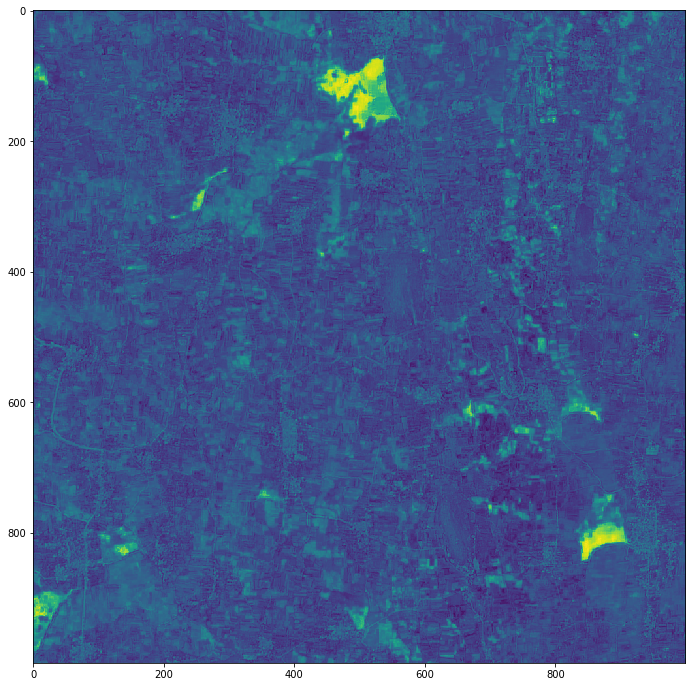

In [45]:
TEST_CROP_Y = [4000, 5000]
TEST_CROP_X = [7000, 8000]
mndwi_4_11 = rasterio.open('./All_Indices/mndwi_4_11.tif').read(1)
fig = plt.figure(figsize=(12,12))
plot.show(mndwi_4_11[TEST_CROP_Y[0]:TEST_CROP_Y[1], TEST_CROP_X[0]:TEST_CROP_X[1]])
# This is used to test

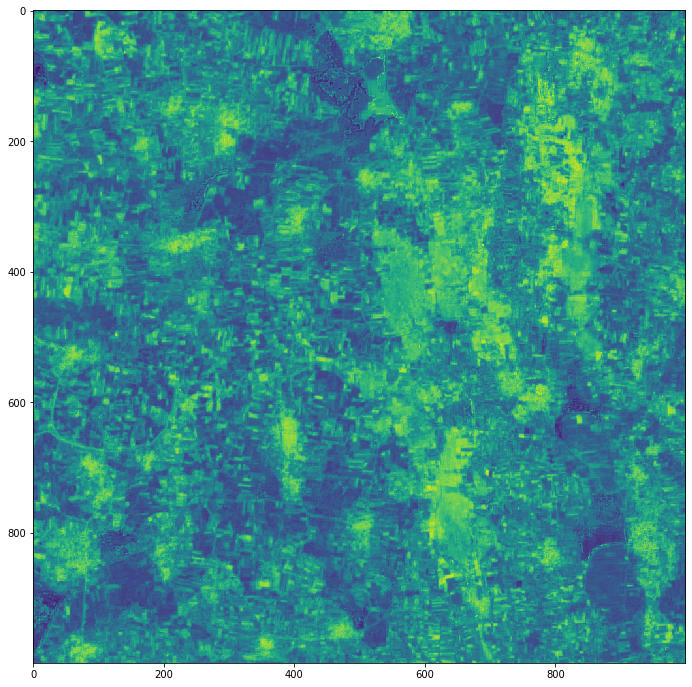

In [46]:
TEST_CROP_Y = [4000, 5000]
TEST_CROP_X = [7000, 8000]
ndbi_11_8  = rasterio.open('./All_Indices/ndbi_11_8.tif').read(1)
fig = plt.figure(figsize=(12,12))
plot.show(ndbi_11_8[TEST_CROP_Y[0]:TEST_CROP_Y[1], TEST_CROP_X[0]:TEST_CROP_X[1]])
# This is used to test

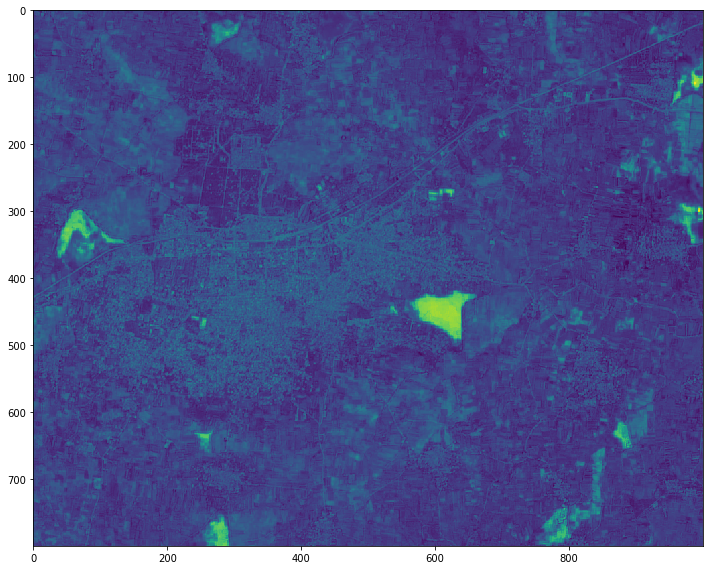

In [10]:
# This was used in training
fig = plt.figure(figsize=(12,12))
plot.show(mndwi_4_11[5700:6500,6500:7500])

In [11]:
# Check validity of data with pixel_positions field in dataframe and above image
feature_list = ["B2", "B3", "B4", "B05", "B06", "B07", "B8", "B08A", 
                "B11", "B12", "ndvi_8_4", "mndwi_4_11", "ndbi_11_8"]
df[df["target"]==1]

,0,1,2,3,4,5,6,7,8,9,10,11,12,target,pixel_positions
6,0.076390,0.082622,0.055006,0.136135,0.431484,0.423884,0.418815,0.461145,0.241690,0.104472,0.809888,0.190464,0.429725,1,"(0, 6)"
7,0.097173,0.098498,0.067612,0.216010,0.482909,0.450551,0.452389,0.475663,0.357778,0.195538,0.807290,0.106257,0.551110,1,"(0, 7)"
8,0.111215,0.139809,0.134794,0.216010,0.482909,0.450551,0.466140,0.475663,0.357778,0.195538,0.718388,0.200315,0.540753,1,"(0, 8)"
9,0.121887,0.141174,0.203839,0.283730,0.486807,0.456928,0.464535,0.484124,0.405441,0.254046,0.631507,0.242759,0.591675,1,"(0, 9)"
10,0.141359,0.178389,0.258129,0.283730,0.486807,0.456928,0.454910,0.484124,0.405441,0.254046,0.564767,0.297107,0.599003,1,"(0, 10)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
799817,0.088747,0.085695,0.048131,0.133877,0.473613,0.487652,0.458577,0.506789,0.238621,0.114048,0.841067,0.181131,0.396130,1,"(799, 817)"
799818,0.081258,0.075794,0.051569,0.133877,0.473613,0.487652,0.496963,0.506789,0.238621,0.114048,0.852866,0.187608,0.370392,1,"(799, 818)"
799819,0.095488,0.116763,0.108007,0.216183,0.515292,0.496696,0.412513,0.508147,0.335686,0.167002,0.723515,0.182852,0.557658,1,"(799, 819)"
799820,0.108594,0.130932,0.114597,0.216183,0.515292,0.496696,0.463848,0.508147,0.335686,0.167002,0.744522,0.192035,0.517631,1,"(799, 820)"


In [12]:
# Make sure all 1s are present in training data (some train some test)

In [13]:
dataset = (df[df["target"]==1].append(df[df["target"]==0].sample(n=500000))).sample(frac=1)

In [14]:
dataset

,0,1,2,3,4,5,6,7,8,9,10,11,12,target,pixel_positions
686602,0.284965,0.309833,0.368572,0.387046,0.567316,0.516986,0.463619,0.537706,0.510893,0.325290,0.464779,0.313000,0.686814,1,"(686, 602)"
188366,0.220371,0.249061,0.314855,0.339816,0.447376,0.390145,0.343302,0.395446,0.409635,0.327971,0.416092,0.344530,0.698733,0,"(188, 366)"
347480,0.105411,0.117105,0.120327,0.173468,0.402099,0.383536,0.363928,0.402340,0.330879,0.187781,0.671976,0.204117,0.593991,1,"(347, 480)"
493256,0.173001,0.213725,0.313709,0.350755,0.472264,0.435362,0.417326,0.449969,0.496880,0.347697,0.480460,0.279543,0.711966,1,"(493, 256)"
549287,0.153155,0.182485,0.194385,0.262893,0.567166,0.542609,0.515183,0.549196,0.396747,0.230968,0.672989,0.239363,0.546518,1,"(549, 287)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
693844,0.292267,0.291396,0.302392,0.331655,0.489355,0.441855,0.368855,0.447671,0.400123,0.290242,0.451682,0.341677,0.665459,0,"(693, 844)"
257763,0.096986,0.098668,0.065893,0.136308,0.518291,0.602435,0.520110,0.606434,0.215710,0.093172,0.841338,0.242594,0.322852,0,"(257, 763)"
697466,0.076952,0.098668,0.063888,0.172252,0.515592,0.578667,0.557580,0.593900,0.251815,0.115771,0.859331,0.195042,0.351649,0,"(697, 466)"
352278,0.049429,0.088426,0.059017,0.148984,0.413193,0.418551,0.526183,0.420932,0.249054,0.097960,0.853907,0.189442,0.366579,1,"(352, 278)"


In [15]:
# All training samples with low mndwi value
low = df[df["12"]<0.5]

# All training samples with high mndwi value
high = df[df["12"]>=0.5]

len(low), len(high)

(401513, 398487)

In [16]:
# Among lows, 0s should be higher percentage of the target
print(len(low[low["target"]==1]), len(low[low["target"]==0]))

# Among highs, 1s should be higher percentage of the target
print(len(high[high["target"]==1]), len(high[high["target"]==0]))

85249 316264
103409 295078


In [17]:
print(83742  / 1271448)
print(399204  / 454380)

# So, 6.6% of samples with a low mndwi value are water
# And, 12.15% of samples with a high mndwi value are non-water elements

0.06586348792872379
0.878568598970025


In [18]:
#X = dataset.drop(columns = ["target", "pixel_positions"])
X = dataset.drop(columns = ["target", "pixel_positions"]) # using all features
y = dataset["target"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [19]:
X_train.shape[0], X_test.shape[0]

(461400, 227258)

In [20]:
1 - sum(y_train==1)/y_train.shape[0] # No skew towards any type of samples

0.7261876896402254

In [21]:
model = tf.keras.Sequential([
    layers.Dense(256, activation=LeakyReLU(), input_shape=(13,)),
    layers.Dense(256, activation=LeakyReLU()),
    layers.Dropout(0.2),
    layers.Dense(256, activation=LeakyReLU()),
    layers.Dropout(0.2),
    layers.Dense(1, activation='sigmoid')])

model.compile(optimizer=tf.keras.optimizers.Adam(0.01),
              loss='binary_crossentropy',
              metrics=['accuracy'])


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [22]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               3584      
_________________________________________________________________
dense_1 (Dense)              (None, 256)               65792     
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               65792     
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 257       
Total params: 135,425
Trainable params: 135,425
Non-trainable params: 0
__________________________________________________

In [23]:
model.fit(x = X_train, y = y_train, batch_size = 256, epochs = 10, validation_split = 0.2)

Train on 369120 samples, validate on 92280 samples
Epoch 1/10
369120/369120 [==============================] - 5s 14us/sample - loss: 0.5844 - acc: 0.7259 - val_loss: 0.5850 - val_acc: 0.7251
Epoch 2/10
369120/369120 [==============================] - 5s 12us/sample - loss: 0.5828 - acc: 0.7258 - val_loss: 0.5828 - val_acc: 0.7256
Epoch 3/10
369120/369120 [==============================] - 5s 12us/sample - loss: 0.5817 - acc: 0.7260 - val_loss: 0.5789 - val_acc: 0.7265
Epoch 4/10
369120/369120 [==============================] - 5s 14us/sample - loss: 0.5819 - acc: 0.7265 - val_loss: 0.5830 - val_acc: 0.7252
Epoch 5/10
369120/369120 [==============================] - 6s 17us/sample - loss: 0.5813 - acc: 0.7262 - val_loss: 0.5783 - val_acc: 0.7259
Epoch 6/10
369120/369120 [==============================] - 5s 14us/sample - loss: 0.5808 - acc: 0.7265 - val_loss: 0.5771 - val_acc: 0.7268
Epoch 7/10
369120/369120 [==============================] - 5s 13us/sample - loss: 0.6901 - acc: 0.7173

In [24]:
sum(y_train)/len(y_train)

0.2738123103597746

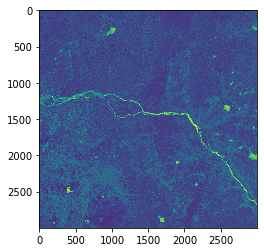

In [25]:
plot.show(mndwi_4_11[TEST_CROP_Y[0]:TEST_CROP_Y[1], TEST_CROP_X[0]:TEST_CROP_X[1]])

In [26]:
# Construct test data
# Replace file names with others if necessary
blue = rasterio.open('./All_Indices/S2_Mandya_B2.tif')
green = rasterio.open('./All_Indices/S2_Mandya_B3.tif')
red = rasterio.open('./All_Indices/S2_Mandya_B4.tif')
vre5 = rasterio.open('./All_Indices/S2_Mandya_B05.tif')
vre6 = rasterio.open('./All_Indices/S2_Mandya_B06.tif')
vre7 = rasterio.open('./All_Indices/S2_Mandya_B07.tif')
nir = rasterio.open('./All_Indices/S2_Mandya_B8.tif')
vre8a = rasterio.open('./All_Indices/S2_Mandya_B08A.tif')
swir11 = rasterio.open('./All_Indices/S2_Mandya_B11.tif')
swir12 = rasterio.open('./All_Indices/S2_Mandya_B12.tif')

In [47]:
test_feature_list = [blue, green, red, vre5, vre6, vre7, nir, vre8a, swir11, swir12]
test_feature_array = []

In [48]:
# Indices are computed in helpers
for feature in test_feature_list:
    image = feature.read(1)
    test_feature_array.append(image[TEST_CROP_Y[0]:TEST_CROP_Y[1], TEST_CROP_X[0]:TEST_CROP_X[1]])

In [49]:
ndvi, mndwi, ndbi = return_indices(test_feature_array)

In [50]:
test_feature_array.append(ndvi)
test_feature_array.append(mndwi)
test_feature_array.append(ndbi)

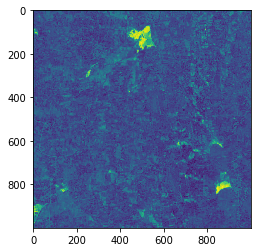

In [51]:
# ndvi from rasterio
plot.show(test_feature_array[-2])

In [61]:
normalized_features = []
for i in range(len(test_feature_array)):
    print(i)
    normalized_features.append(normalize(test_feature_array[i]))

0
1
2
3
4
5
6
7
8
9
10
11
12


In [62]:
normalized_features = np.array(normalized_features)
shp = normalized_features.shape

In [63]:
normalized_features = normalized_features.reshape((shp[0], shp[1]*shp[2]))
normalized_features.shape

(13, 1000000)

In [64]:
normalized_features = normalized_features.T
normalized_features.shape

(1000000, 13)

In [65]:
normalized_features[0].shape

(13,)

In [169]:
y_pred1 = model.predict(normalized_features)

In [170]:
y_pred = y_pred1

In [171]:
y_pred.shape

(1000000, 1)

In [172]:
y_pred[y_pred >= 0.2] = 255
y_pred[y_pred < 0.2] = 0

shape = y_pred.shape[0]

In [173]:
y_pred.shape

(1000000, 1)

In [174]:
len(y_pred[y_pred == 255])

245439

In [175]:
final_image = y_pred.reshape((1000, 1000))

In [176]:
final_image.shape

(1000, 1000)

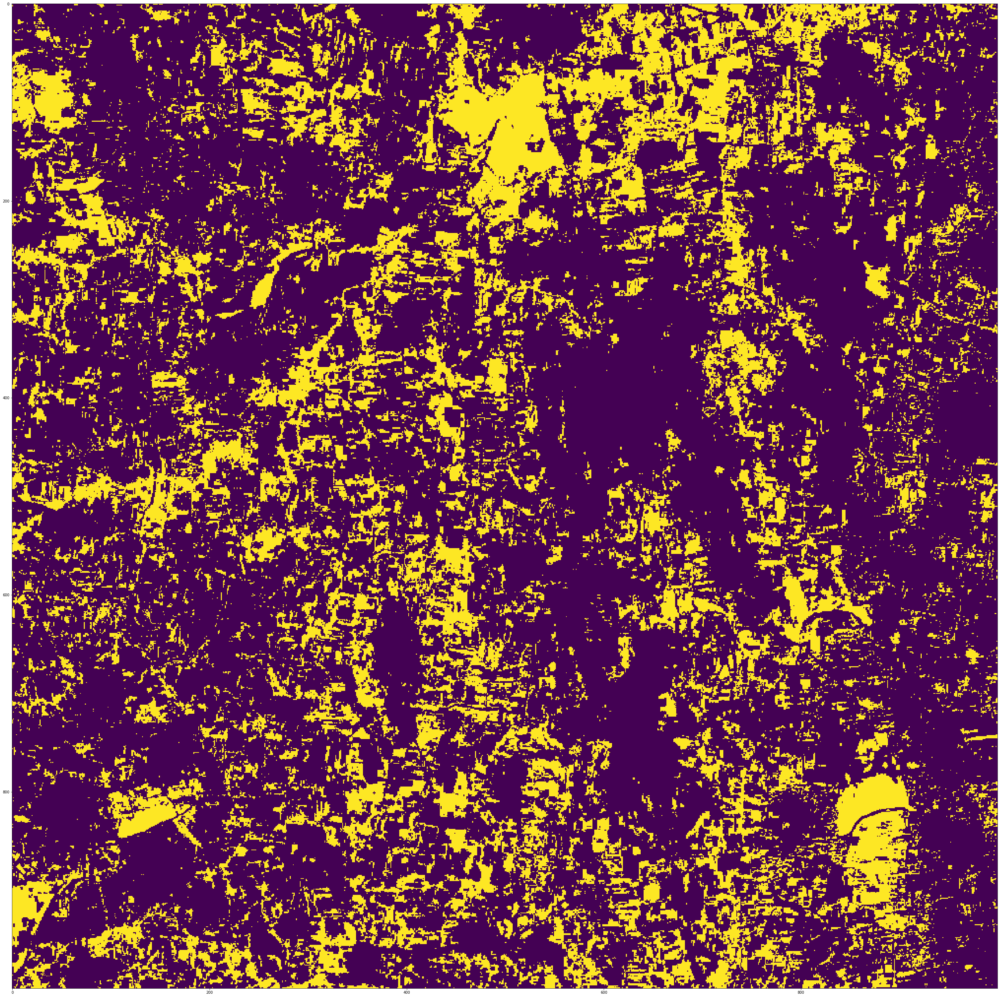

In [177]:
fig = plt.figure(figsize = (50,50))
plot.show(final_image)

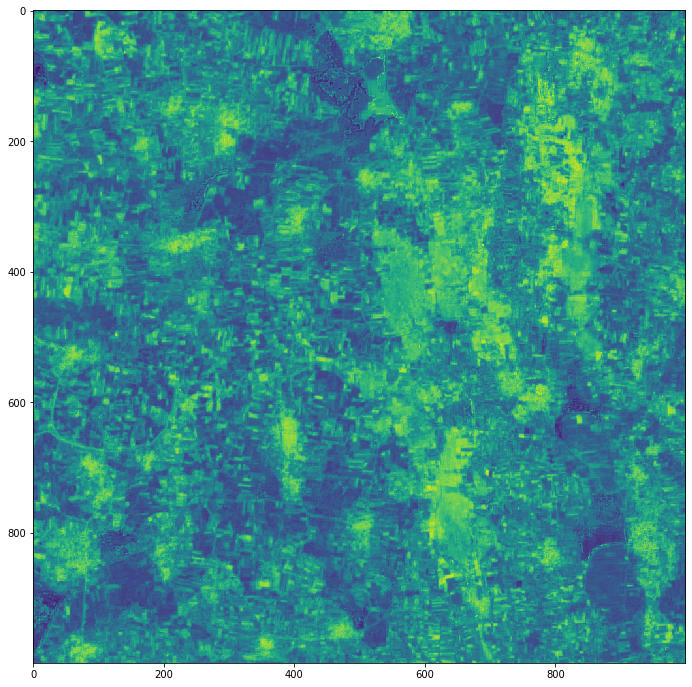

In [127]:
TEST_CROP_Y = [4000, 5000]
TEST_CROP_X = [7000, 8000]
ndbi_11_8  = rasterio.open('./All_Indices/ndbi_11_8.tif').read(1)
fig = plt.figure(figsize=(12,12))
plot.show(ndbi_11_8[TEST_CROP_Y[0]:TEST_CROP_Y[1], TEST_CROP_X[0]:TEST_CROP_X[1]])
# This is used to test

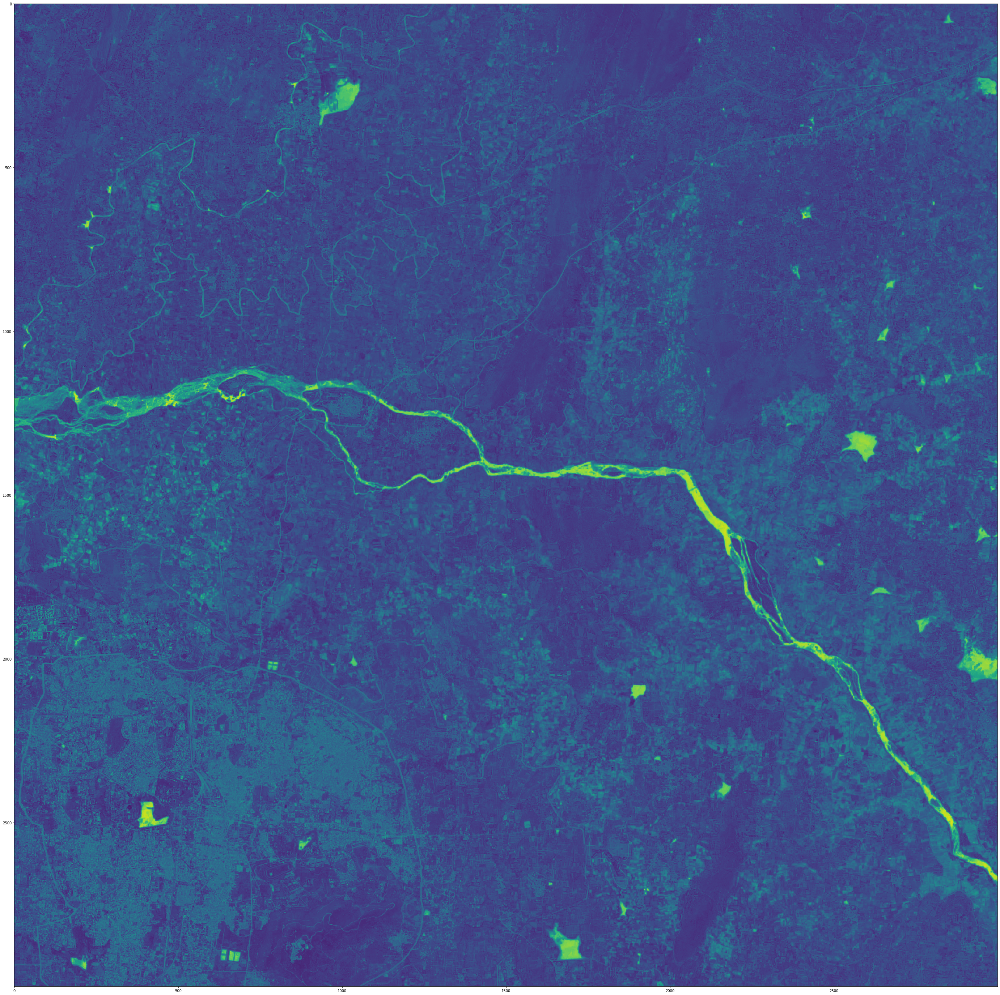

In [111]:
fig = plt.figure(figsize = (50,50))
plot.show(np.array(test_image))

In [ ]:
results = model.predict(X_test)

In [ ]:
for i in range(len(results)):
    print(y_test[i:i+1], results[i])

In [ ]:
clf = svm.SVC(kernel="rbf")
clf.fit(X_train, y_train)

In [ ]:
arr = clf.predict(X_test)

In [ ]:
pd.DataFrame(X_test)

In [ ]:
a, b = list(arr), list(y_test)
true_count = 0
for i in range(6000):
    if(a[i] == b[i]):
        true_count+=1
        print(a[i], b[i], "True")
    else:
        print(a[i], b[i], "False")

In [ ]:
true_count

In [ ]:
X_train